# Desafio técnico de dados da FieldPRO

Elaborado por: Flávio Oliveira Milazzo 

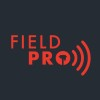

#  O objetivo deste trabalho é construir um modelo de calibração de um dispositivo de um Sensor de chuva baseado em impactos mecânicos

# 2) Instalando pacotes necessários

In [1]:
pip install pandas-profiling

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install --upgrade pandas-profiling

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install pygwalker

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# 2) Importando bibliotecas do Python:

In [4]:
import pandas as pd # Biblioteca pyhon para manusear dataframes
from pandas_profiling import ProfileReport
import numpy as np # Biblioteca Pyhon para trabalhar com matrizes multidimensionais
import matplotlib.pyplot as plt # Biblioteca para gráficos
from datetime import datetime, timezone
import pygwalker as pyg # Biblioteca de Data visualization
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import ydata_profiling

C:\Users\Flávio\AppData\Local\Temp\ipykernel_16260\92225159.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


# 3) Importando o arquivo com a base de dados "Estação Convencional", com os dados coletados referente a quantidade de chuva em milimetros com medições de hora em hora.

In [5]:
df_rain = pd.read_csv('C:/Users/Flávio/Documents/Mestrado/Desafio/Desafio de Dados FieldPRO/Desafio de dados FieldPRO/Estacao_Convencional.csv') 

# 4) Avaliando o tamanho dos registros (linhas e colunas)

In [6]:
df_rain.shape # Avaliando o tamanho do arquivo (linhas e colunas)

(2256, 3)

In [7]:
pd.set_option('display.max_columns', None) # Mostra todas as colunas

In [8]:
df_rain.head(5) #Fazendo a leitura dos 05 primeiros registros

,data,Hora (Brasília),chuva
0,2020-09-01,00:00:00,0.0
1,2020-09-01,01:00:00,0.0
2,2020-09-01,02:00:00,0.0
3,2020-09-01,03:00:00,0.0
4,2020-09-01,04:00:00,0.0


In [9]:
df_rain.info() # Avaliando dados faltantes e missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2256 entries, 0 to 2255
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   data             2256 non-null   object 
 1   Hora (Brasília)  2256 non-null   object 
 2   chuva            2256 non-null   float64
dtypes: float64(1), object(2)
memory usage: 53.0+ KB


In [10]:
df_rain.dtypes # avaliando os tipos de dados

data                object
Hora (Brasília)     object
chuva              float64
dtype: object

In [11]:
df_rain.describe() # avaliando as estatísticas dos dados de chuva

,chuva
count,2256.000000
mean,0.065780
std,0.685743
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,16.800000


# 5) Data Visualization utilizando biblioteca gwalker

In [12]:
datavis_rain = pyg.walk(df_rain) # Visualização da Informação

# 6) Gerando relatório das observações do dataframe df_rain detalhadamente

In [13]:
profile_rain = ProfileReport(df_rain, title='Relatório do Pandas Profiling - Rain', explorative=True)
profile_rain

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
df_rain["data_hora"] = df_rain["data"] + ' ' + df_rain["Hora (Brasília)"] # Criando uma coluna com dados data_hora 

In [15]:
df_rain

,data,Hora (Brasília),chuva,data_hora
0,2020-09-01,00:00:00,0.0,2020-09-01 00:00:00
1,2020-09-01,01:00:00,0.0,2020-09-01 01:00:00
2,2020-09-01,02:00:00,0.0,2020-09-01 02:00:00
3,2020-09-01,03:00:00,0.0,2020-09-01 03:00:00
4,2020-09-01,04:00:00,0.0,2020-09-01 04:00:00
...,...,...,...,...
2251,2020-12-03,19:00:00,0.0,2020-12-03 19:00:00
2252,2020-12-03,20:00:00,0.0,2020-12-03 20:00:00
2253,2020-12-03,21:00:00,0.0,2020-12-03 21:00:00
2254,2020-12-03,22:00:00,0.0,2020-12-03 22:00:00


In [16]:
df_rain['data_hora']=pd.to_datetime(df_rain['data_hora']) # passando para formato datetime

In [17]:
df_rain

,data,Hora (Brasília),chuva,data_hora
0,2020-09-01,00:00:00,0.0,2020-09-01 00:00:00
1,2020-09-01,01:00:00,0.0,2020-09-01 01:00:00
2,2020-09-01,02:00:00,0.0,2020-09-01 02:00:00
3,2020-09-01,03:00:00,0.0,2020-09-01 03:00:00
4,2020-09-01,04:00:00,0.0,2020-09-01 04:00:00
...,...,...,...,...
2251,2020-12-03,19:00:00,0.0,2020-12-03 19:00:00
2252,2020-12-03,20:00:00,0.0,2020-12-03 20:00:00
2253,2020-12-03,21:00:00,0.0,2020-12-03 21:00:00
2254,2020-12-03,22:00:00,0.0,2020-12-03 22:00:00


In [18]:
df_rain['data_hora'] = df_rain['data_hora'].dt.tz_localize(timezone.utc) # Transformando a coluna data_hora em formato UTC

In [19]:
df_rain

,data,Hora (Brasília),chuva,data_hora
0,2020-09-01,00:00:00,0.0,2020-09-01 00:00:00+00:00
1,2020-09-01,01:00:00,0.0,2020-09-01 01:00:00+00:00
2,2020-09-01,02:00:00,0.0,2020-09-01 02:00:00+00:00
3,2020-09-01,03:00:00,0.0,2020-09-01 03:00:00+00:00
4,2020-09-01,04:00:00,0.0,2020-09-01 04:00:00+00:00
...,...,...,...,...
2251,2020-12-03,19:00:00,0.0,2020-12-03 19:00:00+00:00
2252,2020-12-03,20:00:00,0.0,2020-12-03 20:00:00+00:00
2253,2020-12-03,21:00:00,0.0,2020-12-03 21:00:00+00:00
2254,2020-12-03,22:00:00,0.0,2020-12-03 22:00:00+00:00


In [20]:
df_rain['check_rain'] = df_rain['chuva'].apply(lambda x: 0 if x == 0 else 1) # Monta uma nova coluna chamada Check_rain (target) informando 0 em caso de não chover e 1 no caso de chover 
df_rain

,data,Hora (Brasília),chuva,data_hora,check_rain
0,2020-09-01,00:00:00,0.0,2020-09-01 00:00:00+00:00,0
1,2020-09-01,01:00:00,0.0,2020-09-01 01:00:00+00:00,0
2,2020-09-01,02:00:00,0.0,2020-09-01 02:00:00+00:00,0
3,2020-09-01,03:00:00,0.0,2020-09-01 03:00:00+00:00,0
4,2020-09-01,04:00:00,0.0,2020-09-01 04:00:00+00:00,0
...,...,...,...,...,...
2251,2020-12-03,19:00:00,0.0,2020-12-03 19:00:00+00:00,0
2252,2020-12-03,20:00:00,0.0,2020-12-03 20:00:00+00:00,0
2253,2020-12-03,21:00:00,0.0,2020-12-03 21:00:00+00:00,0
2254,2020-12-03,22:00:00,0.0,2020-12-03 22:00:00+00:00,0


# 6) Importando o arquivo com a base de dados "Sensor_FieldPRO", com os dados coletados referente as features do sensor

In [21]:
df_sensor =pd.read_csv('C:/Users/Flávio/Documents/Mestrado/Desafio/Desafio de Dados FieldPRO/Desafio de dados FieldPRO/Sensor_FieldPRO.csv') 

# 7) Avaliando o tamanho dos registros (linhas e colunas)

In [22]:
df_sensor

,Datetime – utc,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
0,2020-09-30T23:00:00Z,38.0,31.366,9412,0,45123,30
1,2020-10-01T00:00:00Z,NaN,NaN,9412,0,45025,31
2,2020-10-01T01:00:00Z,39.0,31.366,9419,0,44923,31
3,2020-10-01T02:00:00Z,39.0,31.322,9419,0,44825,31
4,2020-10-01T03:00:00Z,38.0,31.240,9416,0,44728,31
...,...,...,...,...,...,...,...
1706,2020-12-11T09:00:00Z,82.0,19.480,9422,3,20669,17
1707,2020-12-11T10:00:00Z,69.0,24.000,9429,3,20606,19
1708,2020-12-11T11:00:00Z,63.0,25.440,9436,3,20529,25
1709,2020-12-11T12:00:00Z,60.0,27.160,9439,3,20442,28


In [23]:
df_sensor.dtypes # Avaliando os tipos dos dados dos sensores

Datetime – utc          object
air_humidity_100       float64
air_temperature_100    float64
atm_pressure_main        int64
num_of_resets            int64
piezo_charge             int64
piezo_temperature        int64
dtype: object

In [24]:
df_sensor.describe() # Avaliando Estatísticas

,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
count,1705.000000,1705.000000,1711.000000,1711.000000,1711.000000,1711.000000
mean,60.238710,24.660940,9432.838106,1.646406,42462.030392,24.910579
std,22.100228,6.174219,26.378333,1.090382,13038.238287,8.374122
min,13.000000,12.360000,9350.000000,0.000000,16950.000000,11.000000
25%,41.000000,19.900000,9416.000000,1.000000,32020.000000,18.000000
50%,61.000000,23.020000,9433.000000,2.000000,41765.000000,22.000000
75%,80.000000,29.400000,9450.000000,3.000000,53769.000000,32.000000
max,99.000000,42.664000,9507.000000,3.000000,65533.000000,47.000000


In [25]:
df_sensor.info() # Avaliando dados faltantes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1711 entries, 0 to 1710
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Datetime – utc       1711 non-null   object 
 1   air_humidity_100     1705 non-null   float64
 2   air_temperature_100  1705 non-null   float64
 3   atm_pressure_main    1711 non-null   int64  
 4   num_of_resets        1711 non-null   int64  
 5   piezo_charge         1711 non-null   int64  
 6   piezo_temperature    1711 non-null   int64  
dtypes: float64(2), int64(4), object(1)
memory usage: 93.7+ KB


# 8) Data Visualization utilizando biblioteca gwalker

In [26]:
datavis_sensor = pyg.walk(df_sensor) 

# 9) Gerando relatório das observações do dataframe df_sensor

In [27]:
profile_sensor = ProfileReport(df_sensor, title='Relatório do Pandas Profiling - Sensor', explorative=True)
profile_sensor

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
df_sensor['data_hora']=pd.to_datetime(df_sensor['Datetime – utc']) # formatando os dados de data_hora para posterior merge

In [29]:
df_sensor

,Datetime – utc,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature,data_hora
0,2020-09-30T23:00:00Z,38.0,31.366,9412,0,45123,30,2020-09-30 23:00:00+00:00
1,2020-10-01T00:00:00Z,NaN,NaN,9412,0,45025,31,2020-10-01 00:00:00+00:00
2,2020-10-01T01:00:00Z,39.0,31.366,9419,0,44923,31,2020-10-01 01:00:00+00:00
3,2020-10-01T02:00:00Z,39.0,31.322,9419,0,44825,31,2020-10-01 02:00:00+00:00
4,2020-10-01T03:00:00Z,38.0,31.240,9416,0,44728,31,2020-10-01 03:00:00+00:00
...,...,...,...,...,...,...,...,...
1706,2020-12-11T09:00:00Z,82.0,19.480,9422,3,20669,17,2020-12-11 09:00:00+00:00
1707,2020-12-11T10:00:00Z,69.0,24.000,9429,3,20606,19,2020-12-11 10:00:00+00:00
1708,2020-12-11T11:00:00Z,63.0,25.440,9436,3,20529,25,2020-12-11 11:00:00+00:00
1709,2020-12-11T12:00:00Z,60.0,27.160,9439,3,20442,28,2020-12-11 12:00:00+00:00


# 10) Fazendo o Merge entre df_rain e df_sensor

In [30]:
df_result = pd.merge(df_rain, df_sensor, on='data_hora', how='right')

In [31]:
df_result

,data,Hora (Brasília),chuva,data_hora,check_rain,Datetime – utc,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
0,2020-09-30,23:00:00,0.0,2020-09-30 23:00:00+00:00,0.0,2020-09-30T23:00:00Z,38.0,31.366,9412,0,45123,30
1,2020-10-01,00:00:00,0.0,2020-10-01 00:00:00+00:00,0.0,2020-10-01T00:00:00Z,NaN,NaN,9412,0,45025,31
2,2020-10-01,01:00:00,0.0,2020-10-01 01:00:00+00:00,0.0,2020-10-01T01:00:00Z,39.0,31.366,9419,0,44923,31
3,2020-10-01,02:00:00,0.0,2020-10-01 02:00:00+00:00,0.0,2020-10-01T02:00:00Z,39.0,31.322,9419,0,44825,31
4,2020-10-01,03:00:00,0.0,2020-10-01 03:00:00+00:00,0.0,2020-10-01T03:00:00Z,38.0,31.240,9416,0,44728,31
...,...,...,...,...,...,...,...,...,...,...,...,...
1706,NaN,NaN,NaN,2020-12-11 09:00:00+00:00,NaN,2020-12-11T09:00:00Z,82.0,19.480,9422,3,20669,17
1707,NaN,NaN,NaN,2020-12-11 10:00:00+00:00,NaN,2020-12-11T10:00:00Z,69.0,24.000,9429,3,20606,19
1708,NaN,NaN,NaN,2020-12-11 11:00:00+00:00,NaN,2020-12-11T11:00:00Z,63.0,25.440,9436,3,20529,25
1709,NaN,NaN,NaN,2020-12-11 12:00:00+00:00,NaN,2020-12-11T12:00:00Z,60.0,27.160,9439,3,20442,28


In [32]:
df_result = df_result.dropna() # limpeza das linhas com dados nulos ou faltantes, outras opções seriam, preencher com mediana ou dados sintéticos

In [33]:
df_result

,data,Hora (Brasília),chuva,data_hora,check_rain,Datetime – utc,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
0,2020-09-30,23:00:00,0.0,2020-09-30 23:00:00+00:00,0.0,2020-09-30T23:00:00Z,38.0,31.366,9412,0,45123,30
2,2020-10-01,01:00:00,0.0,2020-10-01 01:00:00+00:00,0.0,2020-10-01T01:00:00Z,39.0,31.366,9419,0,44923,31
3,2020-10-01,02:00:00,0.0,2020-10-01 02:00:00+00:00,0.0,2020-10-01T02:00:00Z,39.0,31.322,9419,0,44825,31
4,2020-10-01,03:00:00,0.0,2020-10-01 03:00:00+00:00,0.0,2020-10-01T03:00:00Z,38.0,31.240,9416,0,44728,31
5,2020-10-01,04:00:00,0.0,2020-10-01 04:00:00+00:00,0.0,2020-10-01T04:00:00Z,39.0,30.828,9411,0,44632,30
...,...,...,...,...,...,...,...,...,...,...,...,...
1524,2020-12-03,19:00:00,0.0,2020-12-03 19:00:00+00:00,0.0,2020-12-03T19:00:00Z,86.0,20.880,9412,3,35217,20
1525,2020-12-03,20:00:00,0.0,2020-12-03 20:00:00+00:00,0.0,2020-12-03T20:00:00Z,90.0,20.980,9409,3,35132,19
1526,2020-12-03,21:00:00,0.0,2020-12-03 21:00:00+00:00,0.0,2020-12-03T21:00:00Z,93.0,20.620,9408,3,35068,20
1527,2020-12-03,22:00:00,0.0,2020-12-03 22:00:00+00:00,0.0,2020-12-03T22:00:00Z,94.0,20.080,9406,3,35007,19


In [34]:
profile_df_result = ProfileReport(df_result, title='Relatório do Pandas Profiling - Data Frame Merge', explorative=True)
profile_df_result

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 11) Avaliando a estratégia de treinamento do Modelo:
    

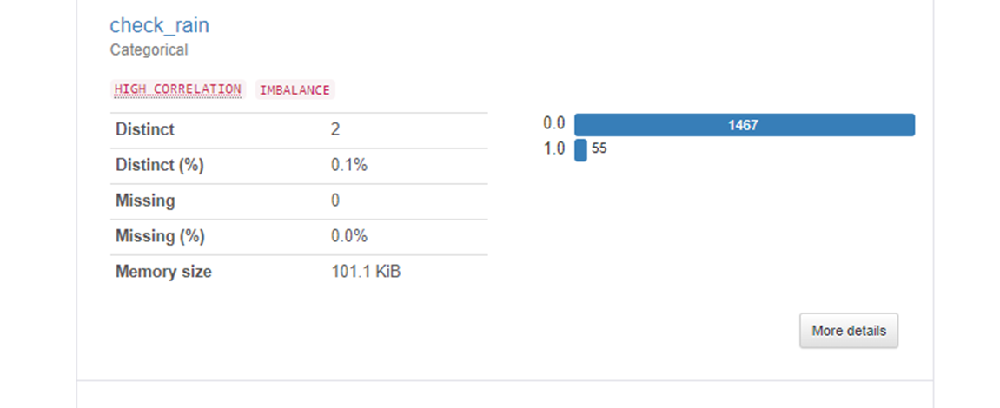
Obs : Podemos notar um enorme desbalanceamento no target "check_rain", portanto a estratégia adotada foi separar o df_result em dois (0 sem chuva, 1467 observações) e (1 com chuva, 55 observações) e em seguida fosse possível balancear uma base de treinamento/testes e validação escolhendo 150 observações sem chuva e fosse inclúida as 55 com chuva

In [35]:
df_result_0 = df_result[df_result['check_rain'] == 0.0] # dataframe observações sem chuva
df_result_1 = df_result[df_result['check_rain'] == 1.0] # dataframe observações com chuva


In [36]:
df_result_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55 entries, 148 to 1522
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   data                 55 non-null     object             
 1   Hora (Brasília)      55 non-null     object             
 2   chuva                55 non-null     float64            
 3   data_hora            55 non-null     datetime64[ns, UTC]
 4   check_rain           55 non-null     float64            
 5   Datetime – utc       55 non-null     object             
 6   air_humidity_100     55 non-null     float64            
 7   air_temperature_100  55 non-null     float64            
 8   atm_pressure_main    55 non-null     int64              
 9   num_of_resets        55 non-null     int64              
 10  piezo_charge         55 non-null     int64              
 11  piezo_temperature    55 non-null     int64              
dtypes: datetime64[ns, UT

In [37]:
df_result_0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1467 entries, 0 to 1528
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   data                 1467 non-null   object             
 1   Hora (Brasília)      1467 non-null   object             
 2   chuva                1467 non-null   float64            
 3   data_hora            1467 non-null   datetime64[ns, UTC]
 4   check_rain           1467 non-null   float64            
 5   Datetime – utc       1467 non-null   object             
 6   air_humidity_100     1467 non-null   float64            
 7   air_temperature_100  1467 non-null   float64            
 8   atm_pressure_main    1467 non-null   int64              
 9   num_of_resets        1467 non-null   int64              
 10  piezo_charge         1467 non-null   int64              
 11  piezo_temperature    1467 non-null   int64              
dtypes: datetime64[ns, UT

In [38]:
df_result_0_Sel = df_result_0.sample(n=150)  # Elege de formar aleatória 70 observações 

In [39]:
df_result = pd.concat([df_result_1, df_result_0_Sel]) # Consolida os dois df em um df_result

In [40]:
df_result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 205 entries, 148 to 696
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   data                 205 non-null    object             
 1   Hora (Brasília)      205 non-null    object             
 2   chuva                205 non-null    float64            
 3   data_hora            205 non-null    datetime64[ns, UTC]
 4   check_rain           205 non-null    float64            
 5   Datetime – utc       205 non-null    object             
 6   air_humidity_100     205 non-null    float64            
 7   air_temperature_100  205 non-null    float64            
 8   atm_pressure_main    205 non-null    int64              
 9   num_of_resets        205 non-null    int64              
 10  piezo_charge         205 non-null    int64              
 11  piezo_temperature    205 non-null    int64              
dtypes: datetime64[ns, UT

# 12) Fazendo uma cópia resumida ou subset de df_result, apenas com as colunas de interesse neste momento.

In [41]:
df_result.info() # Avaliando as colunas pertinentes para o modelo de calibração

<class 'pandas.core.frame.DataFrame'>
Int64Index: 205 entries, 148 to 696
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   data                 205 non-null    object             
 1   Hora (Brasília)      205 non-null    object             
 2   chuva                205 non-null    float64            
 3   data_hora            205 non-null    datetime64[ns, UTC]
 4   check_rain           205 non-null    float64            
 5   Datetime – utc       205 non-null    object             
 6   air_humidity_100     205 non-null    float64            
 7   air_temperature_100  205 non-null    float64            
 8   atm_pressure_main    205 non-null    int64              
 9   num_of_resets        205 non-null    int64              
 10  piezo_charge         205 non-null    int64              
 11  piezo_temperature    205 non-null    int64              
dtypes: datetime64[ns, UT

In [42]:
df=df_result[[ 'data_hora',  'air_humidity_100', 'air_temperature_100',
       'atm_pressure_main', 'num_of_resets','piezo_charge',  'piezo_temperature',
       'check_rain']].copy()

In [43]:
df

,data_hora,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature,check_rain
148,2020-10-07 07:00:00+00:00,59.0,24.352,9407,0,29626,23,1.0
197,2020-10-09 08:00:00+00:00,80.0,21.094,9391,0,25104,20,1.0
198,2020-10-09 09:00:00+00:00,82.0,20.966,9387,0,25043,20,1.0
200,2020-10-09 11:00:00+00:00,93.0,19.946,9417,0,24835,19,1.0
215,2020-10-10 02:00:00+00:00,90.0,16.226,9440,0,23565,15,1.0
...,...,...,...,...,...,...,...,...
339,2020-10-15 06:00:00+00:00,91.0,18.280,9452,1,61478,17,0.0
1140,2020-11-17 19:00:00+00:00,30.0,35.200,9357,2,38477,39,0.0
709,2020-10-30 20:00:00+00:00,90.0,17.560,9461,1,32169,17,0.0
209,2020-10-09 20:00:00+00:00,58.0,24.422,9418,0,23930,25,0.0


# 13) Visualização da Informação referente ao df

In [44]:
datavis_df = pyg.walk(df)

# 13) Avaliando as features do relatório final de df

In [45]:
profile_df = ProfileReport(df, title='Relatório do Pandas Profiling - Data Frame Modelo', explorative=True)
profile_df

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 14) Separando o df em dois dataframes, sendo um para validação final e o outro para treinamento/testes

In [46]:
# Divide o DataFrame em 80% para treinamento e testes preliminares e 20% para validação final
train_test, validation = train_test_split(df, test_size=0.2, random_state=42)

In [47]:
train_test # Base de treinamento e teste

,data_hora,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature,check_rain
88,2020-10-04 19:00:00+00:00,33.0,35.510,9417,0,35187,40,0.0
1488,2020-12-02 07:00:00+00:00,83.0,21.420,9418,3,39223,19,0.0
870,2020-11-06 13:00:00+00:00,38.0,26.620,9459,2,62079,29,0.0
217,2020-10-10 04:00:00+00:00,90.0,16.270,9433,0,23470,14,0.0
1163,2020-11-18 18:00:00+00:00,94.0,19.580,9390,2,35336,19,1.0
...,...,...,...,...,...,...,...,...
1497,2020-12-02 16:00:00+00:00,51.0,32.020,9423,3,38405,36,0.0
675,2020-10-29 10:00:00+00:00,57.0,20.140,9409,1,34543,16,1.0
574,2020-10-25 01:00:00+00:00,78.0,22.500,9412,1,42546,21,0.0
1273,2020-11-23 08:00:00+00:00,68.0,18.180,9462,3,59263,16,0.0


In [48]:
train_test.info() # base de Validação final

<class 'pandas.core.frame.DataFrame'>
Int64Index: 164 entries, 88 to 134
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   data_hora            164 non-null    datetime64[ns, UTC]
 1   air_humidity_100     164 non-null    float64            
 2   air_temperature_100  164 non-null    float64            
 3   atm_pressure_main    164 non-null    int64              
 4   num_of_resets        164 non-null    int64              
 5   piezo_charge         164 non-null    int64              
 6   piezo_temperature    164 non-null    int64              
 7   check_rain           164 non-null    float64            
dtypes: datetime64[ns, UTC](1), float64(3), int64(4)
memory usage: 11.5 KB


In [49]:
validation

,data_hora,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature,check_rain
676,2020-10-29 11:00:00+00:00,71.0,20.540,9432,1,34483,19,1.0
542,2020-10-23 17:00:00+00:00,33.0,35.200,9427,1,45265,40,1.0
604,2020-10-26 07:00:00+00:00,77.0,20.920,9388,1,40154,20,0.0
995,2020-11-11 18:00:00+00:00,57.0,29.240,9433,2,51039,30,0.0
1114,2020-11-16 17:00:00+00:00,35.0,35.180,9396,2,40944,39,0.0
758,2020-11-01 21:00:00+00:00,37.0,26.140,9429,1,28667,27,0.0
450,2020-10-19 21:00:00+00:00,38.0,29.660,9401,1,53246,33,0.0
1090,2020-11-15 17:00:00+00:00,55.0,27.160,9420,2,42867,31,0.0
484,2020-10-21 07:00:00+00:00,80.0,21.120,9458,1,50439,19,0.0
1092,2020-11-15 19:00:00+00:00,57.0,25.720,9419,2,42640,28,0.0


In [50]:
validation.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41 entries, 676 to 168
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   data_hora            41 non-null     datetime64[ns, UTC]
 1   air_humidity_100     41 non-null     float64            
 2   air_temperature_100  41 non-null     float64            
 3   atm_pressure_main    41 non-null     int64              
 4   num_of_resets        41 non-null     int64              
 5   piezo_charge         41 non-null     int64              
 6   piezo_temperature    41 non-null     int64              
 7   check_rain           41 non-null     float64            
dtypes: datetime64[ns, UTC](1), float64(3), int64(4)
memory usage: 2.9 KB


# 15) Treinamento do Modelo de Calibração/Predição

In [51]:
# separando as variáveis do alvo para iniciar treinamento do modelo

In [52]:
X = train_test.drop('check_rain', axis = 1) # Retirando target
X = X.drop('data_hora', axis = 1) # Retirando datas

In [53]:
X

,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
88,33.0,35.510,9417,0,35187,40
1488,83.0,21.420,9418,3,39223,19
870,38.0,26.620,9459,2,62079,29
217,90.0,16.270,9433,0,23470,14
1163,94.0,19.580,9390,2,35336,19
...,...,...,...,...,...,...
1497,51.0,32.020,9423,3,38405,36
675,57.0,20.140,9409,1,34543,16
574,78.0,22.500,9412,1,42546,21
1273,68.0,18.180,9462,3,59263,16


In [54]:
y=train_test["check_rain"] # Tabela verdade/target

In [55]:
contagem = train_test['check_rain'].value_counts()

In [56]:
contagem # verificação quantidade de observações com e sem chuva para treinamento e testes

0.0    116
1.0     48
Name: check_rain, dtype: int64

# 15) Separando as bases de treinamento e testes

In [57]:
X_treino, X_teste, y_treino, y_teste = train_test_split(X, y, test_size = 0.2, random_state=22, stratify=y)

In [58]:
X_treino

,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
156,22.0,39.670,9435,0,28890,43
134,20.0,42.664,9408,0,31008,47
1337,48.0,27.300,9431,3,53333,25
870,38.0,26.620,9459,2,62079,29
678,91.0,19.020,9440,1,34296,18
...,...,...,...,...,...,...
620,87.0,19.540,9398,1,38988,19
1035,83.0,20.220,9425,2,48083,17
23,39.0,28.490,9394,0,41621,27
1064,36.0,34.680,9414,2,45506,38


In [59]:
y_treino

156     0.0
134     0.0
1337    0.0
870     0.0
678     1.0
       ... 
620     0.0
1035    0.0
23      0.0
1064    0.0
1488    0.0
Name: check_rain, Length: 131, dtype: float64

In [60]:
X_teste

,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
215,90.0,16.226,9440,0,23565,15
396,38.0,27.880,9480,1,57718,34
1175,96.0,16.060,9410,2,34304,15
987,94.0,19.960,9444,2,52052,18
1501,55.0,30.220,9373,3,37957,30
1486,86.0,21.940,9421,3,39346,20
610,69.0,22.080,9417,1,39770,22
1070,33.0,33.440,9372,2,44709,36
256,27.0,32.444,9436,0,20447,38
637,29.0,30.840,9380,1,37845,37


In [61]:
y_teste

215     1.0
396     0.0
1175    1.0
987     0.0
1501    1.0
1486    0.0
610     1.0
1070    0.0
256     0.0
637     0.0
774     0.0
1497    0.0
1159    1.0
83      0.0
126     0.0
345     1.0
944     0.0
565     0.0
897     0.0
296     0.0
482     0.0
981     1.0
844     0.0
1509    0.0
1416    0.0
1132    0.0
582     0.0
190     0.0
1020    1.0
536     0.0
198     1.0
941     0.0
1516    1.0
Name: check_rain, dtype: float64

# 16) Criação do modelo de ML: Neste caso será utilizado o perceptron com multiplas camadas com retro propagação

In [62]:
clf = MLPClassifier(hidden_layer_sizes=(1000))
clf.fit(X_treino, y_treino)
#Imprimindo resultados :
resultado = clf.score(X_teste, y_teste)
print("Acurácia :", resultado)

Acurácia : 0.696969696969697


In [63]:
y_pred=clf.predict(X_teste)

In [64]:
print(pd.crosstab(y_teste, y_pred, rownames=['Real'],colnames=['Predito'], margins=True))

Predito  0.0  All
Real             
0.0       23   23
1.0       10   10
All       33   33


In [65]:
print(classification_report(y_teste, y_pred))

              precision    recall  f1-score   support

         0.0       0.70      1.00      0.82        23
         1.0       0.00      0.00      0.00        10

    accuracy                           0.70        33
   macro avg       0.35      0.50      0.41        33
weighted avg       0.49      0.70      0.57        33



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [66]:
# Obtém os pesos das features do modelo para efeito de calibração
feature_weights = clf.coefs_

# Exibe os pesos das features
print("Pesos das features:")
for i, layer_weights in enumerate(feature_weights):
    print(f"Camada {i}:")
    for j, feature_weight in enumerate(layer_weights):
        print(f"Feature {j+1}: {feature_weight}")
    print()


Pesos das features:
Camada 0:
Feature 1: [ 4.80701596e-02 -3.70711491e-02 -2.10145887e-02 -7.80546868e-03
 -3.92897774e-02 -4.10898692e-02  3.93476989e-02 -4.04566100e-02
  5.26097984e-03  6.10587880e-02  6.95198410e-02 -6.24457451e-02
 -4.83706077e-02 -5.53992387e-02 -6.91465170e-02  6.75876913e-02
 -3.27335229e-03  4.37517743e-02 -7.43124516e-02 -2.72049681e-02
 -5.31730047e-04  4.09429629e-02 -2.24832355e-02  4.85739011e-02
  6.75572061e-02  2.79941270e-02 -3.50494593e-02  3.02407342e-02
  5.47300296e-02 -7.40182475e-03  3.14836793e-02 -2.63594606e-02
 -5.46926487e-02 -4.96201584e-02  2.98821713e-02 -1.04040976e-02
 -5.74672247e-03  5.50883321e-02 -7.04732168e-02 -6.03694437e-02
  4.76255339e-03  3.38738585e-03  9.16570533e-03  2.18284539e-02
  1.45302090e-03  1.72725831e-02 -5.56802523e-02  7.03780887e-02
  7.27355531e-02  2.45726993e-03 -9.62939045e-03 -6.08832784e-02
  3.16141771e-02 -1.08995609e-02 -4.87436389e-02  4.86046496e-02
 -6.09967561e-02  4.66623244e-02  1.49147552e-02 

Feature 4: [-3.90353639e-02  5.11010909e-02 -7.04371676e-02  6.26669838e-02
  2.41169532e-02 -3.70036456e-02 -2.67488305e-03 -4.67791144e-02
  7.13585783e-02  3.41740156e-02 -5.30075941e-02 -6.72567274e-02
  4.24252760e-03  4.02988881e-02  7.06099754e-02  4.47671194e-02
 -6.21979462e-03 -4.80519499e-02  1.47611655e-02 -3.13576513e-02
 -6.65572950e-02 -5.99251748e-02  4.59251928e-03  5.55418423e-02
  4.36573966e-02  6.59024014e-02  2.32424917e-02 -6.53167443e-02
 -4.27809403e-02 -1.81890188e-02  2.50847019e-02  7.42535952e-02
 -2.68995447e-02 -6.75398292e-02 -1.81910414e-02 -6.97718585e-02
  6.95103601e-02 -3.71495036e-02 -6.02518815e-02  1.54726999e-02
  4.78803758e-02  6.22099921e-03 -6.58896210e-02 -7.12892151e-02
 -4.05999262e-02  8.12934194e-03  3.09694042e-02  5.20031910e-02
  6.11299492e-02 -1.08119675e-03 -2.43245505e-02 -2.21733392e-02
 -5.02206982e-02  3.40930829e-02 -4.12898961e-02 -1.22732115e-02
 -5.21215824e-02  8.84038172e-03 -4.69491811e-02 -4.44581351e-02
 -4.93302220e-

Feature 150: [-0.0578253]
Feature 151: [0.05561226]
Feature 152: [-0.00337105]
Feature 153: [0.0655895]
Feature 154: [-0.0372268]
Feature 155: [0.0461108]
Feature 156: [0.06102849]
Feature 157: [-0.01870287]
Feature 158: [0.02602271]
Feature 159: [0.01661271]
Feature 160: [-0.01896332]
Feature 161: [0.06523143]
Feature 162: [-0.04758184]
Feature 163: [-0.04108409]
Feature 164: [0.06988218]
Feature 165: [-0.02130073]
Feature 166: [-0.05537063]
Feature 167: [0.02091618]
Feature 168: [-0.06834637]
Feature 169: [-0.0253452]
Feature 170: [0.00400826]
Feature 171: [-0.04522193]
Feature 172: [0.02679399]
Feature 173: [0.01849849]
Feature 174: [0.0519525]
Feature 175: [-0.03381947]
Feature 176: [0.04887351]
Feature 177: [0.07205237]
Feature 178: [-0.03140518]
Feature 179: [-0.06670532]
Feature 180: [-0.04374819]
Feature 181: [-0.04231156]
Feature 182: [-0.01763909]
Feature 183: [-0.03022148]
Feature 184: [0.0182814]
Feature 185: [-0.00774419]
Feature 186: [0.03419996]
Feature 187: [-0.00299661

Feature 634: [-0.0273737]
Feature 635: [-0.01358028]
Feature 636: [0.03429666]
Feature 637: [-0.04543839]
Feature 638: [0.02507495]
Feature 639: [0.00147298]
Feature 640: [-0.06973207]
Feature 641: [-0.02907883]
Feature 642: [0.00550418]
Feature 643: [0.04381431]
Feature 644: [-0.03107959]
Feature 645: [-0.04461016]
Feature 646: [-0.03123393]
Feature 647: [-0.06933657]
Feature 648: [-0.06451212]
Feature 649: [-0.01853879]
Feature 650: [0.07268698]
Feature 651: [0.05948764]
Feature 652: [0.02160587]
Feature 653: [-0.00370203]
Feature 654: [0.06192706]
Feature 655: [0.0286343]
Feature 656: [0.05520404]
Feature 657: [0.03934136]
Feature 658: [-0.03830735]
Feature 659: [0.02572682]
Feature 660: [0.03045659]
Feature 661: [-0.02711523]
Feature 662: [0.01298766]
Feature 663: [0.06487947]
Feature 664: [-6.43869589e-05]
Feature 665: [-0.01612279]
Feature 666: [-0.06444902]
Feature 667: [-0.05429545]
Feature 668: [0.04084647]
Feature 669: [0.04864384]
Feature 670: [-0.01929453]
Feature 671: [-0.

In [67]:
# Obtém os nomes das features do modelo
feature_names = clf.feature_names_in_

# Exibe os nomes das features
print("Nomes das features:")
for feature_name in feature_names:
    print(feature_name)

Nomes das features:
air_humidity_100
air_temperature_100
atm_pressure_main
num_of_resets
piezo_charge
piezo_temperature


In [68]:
# Obtém os nomes das features do modelo
feature_names = X_treino.columns
feature_dict = {i: name for i, name in enumerate(feature_names)}

# Exibe o dicionário com os nomes e números das features
print("Dicionário com os nomes e números das features:")
print(feature_dict)


Dicionário com os nomes e números das features:
{0: 'air_humidity_100', 1: 'air_temperature_100', 2: 'atm_pressure_main', 3: 'num_of_resets', 4: 'piezo_charge', 5: 'piezo_temperature'}


# 17) Aplicando o modelo de previsão para a base de validação

#Entrando com os dados de validação

In [69]:
X_validation = validation.drop('data_hora', axis=1)
X_validation = X_validation.drop('check_rain', axis=1)

In [70]:
X_validation

,air_humidity_100,air_temperature_100,atm_pressure_main,num_of_resets,piezo_charge,piezo_temperature
676,71.0,20.540,9432,1,34483,19
542,33.0,35.200,9427,1,45265,40
604,77.0,20.920,9388,1,40154,20
995,57.0,29.240,9433,2,51039,30
1114,35.0,35.180,9396,2,40944,39
758,37.0,26.140,9429,1,28667,27
450,38.0,29.660,9401,1,53246,33
1090,55.0,27.160,9420,2,42867,31
484,80.0,21.120,9458,1,50439,19
1092,57.0,25.720,9419,2,42640,28


In [71]:
X_teste = X_validation

In [72]:
y_validation=validation["check_rain"]

In [73]:
y_validation

676     1.0
542     1.0
604     0.0
995     0.0
1114    0.0
758     0.0
450     0.0
1090    0.0
484     0.0
1092    0.0
307     0.0
793     0.0
1150    0.0
113     0.0
977     0.0
1196    0.0
679     1.0
284     0.0
806     0.0
1459    0.0
1264    0.0
752     0.0
524     0.0
1154    1.0
988     1.0
677     1.0
273     0.0
953     0.0
850     0.0
318     0.0
509     0.0
820     0.0
479     0.0
709     0.0
270     0.0
748     0.0
90      0.0
71      0.0
1388    1.0
1181    0.0
168     0.0
Name: check_rain, dtype: float64

In [74]:
y_teste = y_validation

In [75]:
# usando o modelo para classificar a base de validação

In [76]:
y_pred=clf.predict(X_teste)

In [77]:
resultado = clf.score(X_validation, y_validation)
print("Acurácia :", resultado)

Acurácia : 0.8292682926829268


In [78]:
#Confusion Matrix

In [79]:
print(pd.crosstab(y_validation, y_pred, rownames=['Real'],colnames=['Predito'], margins=True))

Predito  0.0  All
Real             
0.0       34   34
1.0        7    7
All       41   41


In [80]:
print(classification_report(y_validation, y_pred))

              precision    recall  f1-score   support

         0.0       0.83      1.00      0.91        34
         1.0       0.00      0.00      0.00         7

    accuracy                           0.83        41
   macro avg       0.41      0.50      0.45        41
weighted avg       0.69      0.83      0.75        41



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# 18) Conclusão é de que os primeiros resultados se mostraram bastante promissores, tendo em vista que a base de treinamento após ser balanceada ainda demanda mais observações. Outros classificadores também podem ser testados tais como RBF, arvoré de decisão, entre outros.

In [81]:
# Fim do desafio